#    Final Project : <b> Traffic Violation Analysis </b> 
 
---
- Sijan Shrestha
- @03111789
---

# Import Required Libraries
Import the necessary libraries, including pandas, numpy, matplotlib, seaborn, and plotly.

In [237]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# Load the Dataset
Load the dataset into a pandas DataFrame.

In [238]:
df = pd.read_csv("traffic_violaions.csv")

In [275]:
df_new = df.drop(columns=["country_name"]) # As the values in this column are all the empty we can drop this
df_new

,stop_date,stop_time,driver_gender,driver_age_raw,driver_age,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop
0,1/2/2005,1:55,M,1985.0,20.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False
1,1/18/2005,8:15,M,1965.0,40.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False
2,1/23/2005,23:15,M,1972.0,33.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False
3,2/20/2005,17:15,M,1986.0,19.0,White,Call for Service,Other,False,NaN,Arrest Driver,True,16-30 Min,False
4,3/14/2005,10:00,F,1984.0,21.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52961,10/5/2011,1:55,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,False
52962,10/5/2011,6:43,M,1986.0,25.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False
52963,10/5/2011,6:49,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,False
52964,10/5/2011,7:19,F,1986.0,25.0,White,Speeding,Speeding,False,NaN,Citation,False,0-15 Min,False


# Data Cleaning and Preprocessing
Handle missing values, convert data types, and preprocess the data for analysis.

In [241]:
df_new.isnull().sum()

stop_date                 0
stop_time                 1
driver_gender          3386
driver_age_raw         3378
driver_age             3620
driver_race            3385
violation_raw          3385
violation              3385
search_conducted          1
search_type           50881
stop_outcome           3385
is_arrested            3385
stop_duration          3385
drugs_related_stop        1
dtype: int64

In [242]:
#creating a new column as the data are from Maryland's county
df_new["County"] = "Maryland"

In [243]:
# Convert data types
df_new['stop_date'] = pd.to_datetime(df_new['stop_date'], format='%m/%d/%Y', errors='coerce')  # Convert stop_date to datetime
df_new['stop_time'] = pd.to_datetime(df_new['stop_time'], format='%H:%M').dt.time  # Convert stop_time to time

In [262]:
df_new = df_new[df_new.isna().sum(axis=1) < 3] # Drop rows with more than 3 missing values
# Calculate the mean of the driver_age column
mean_driver_age = df_new['driver_age'].mean()

# Fill the empty driver_age column with the mean value
df_new['driver_age'] = df_new['driver_age'].fillna(mean_driver_age)

In [263]:
df_new.isnull().sum()

stop_date             0
stop_time             0
driver_gender         1
driver_age_raw        0
driver_age            0
driver_race           0
violation_raw         0
violation             0
search_conducted      0
search_type           0
stop_outcome          0
is_arrested           0
stop_duration         0
drugs_related_stop    0
County                0
dtype: int64

In [264]:
df_new

,stop_date,stop_time,driver_gender,driver_age_raw,driver_age,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop,County
0,2005-01-02,01:55:00,M,1985.0,20.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
1,2005-01-18,08:15:00,M,1965.0,40.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
2,2005-01-23,23:15:00,M,1972.0,33.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
3,2005-02-20,17:15:00,M,1986.0,19.0,White,Call for Service,Other,False,Not searched,Arrest Driver,True,16-30 Min,False,Maryland
4,2005-03-14,10:00:00,F,1984.0,21.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52956,2011-10-04,22:22:00,M,1979.0,32.0,White,Speeding,Speeding,False,Not searched,Arrest Driver,True,0-15 Min,False,Maryland
52958,2011-10-04,22:36:00,F,1967.0,44.0,Hispanic,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
52959,2011-10-04,23:25:00,F,1991.0,20.0,Black,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
52962,2011-10-05,06:43:00,M,1986.0,25.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland


In [265]:

# Fill empty values in 'search_type' with "Not searched"
df_new.loc[:, 'search_type'] = df_new['search_type'].fillna("Not searched")

In [266]:
df_new.isnull().sum()

stop_date             0
stop_time             0
driver_gender         1
driver_age_raw        0
driver_age            0
driver_race           0
violation_raw         0
violation             0
search_conducted      0
search_type           0
stop_outcome          0
is_arrested           0
stop_duration         0
drugs_related_stop    0
County                0
dtype: int64

In [249]:
df_new

,stop_date,stop_time,driver_gender,driver_age_raw,driver_age,driver_race,violation_raw,violation,search_conducted,search_type,stop_outcome,is_arrested,stop_duration,drugs_related_stop,County
0,2005-01-02,01:55:00,M,1985.0,20.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
1,2005-01-18,08:15:00,M,1965.0,40.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
2,2005-01-23,23:15:00,M,1972.0,33.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
3,2005-02-20,17:15:00,M,1986.0,19.0,White,Call for Service,Other,False,Not searched,Arrest Driver,True,16-30 Min,False,Maryland
4,2005-03-14,10:00:00,F,1984.0,21.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52956,2011-10-04,22:22:00,M,1979.0,32.0,White,Speeding,Speeding,False,Not searched,Arrest Driver,True,0-15 Min,False,Maryland
52958,2011-10-04,22:36:00,F,1967.0,44.0,Hispanic,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
52959,2011-10-04,23:25:00,F,1991.0,20.0,Black,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland
52962,2011-10-05,06:43:00,M,1986.0,25.0,White,Speeding,Speeding,False,Not searched,Citation,False,0-15 Min,False,Maryland


# Exploratory Data Analysis (EDA)
Perform exploratory data analysis to understand the dataset.

In [268]:
# Summary statistics for driver_age_raw and driver_age
print(df_new[['driver_age_raw', 'driver_age']].describe())

       driver_age_raw    driver_age
count    49581.000000  49581.000000
mean      1965.790323     34.172068
std        131.614117     12.739215
min          0.000000     15.000000
25%       1965.000000     23.000000
50%       1977.000000     31.000000
75%       1985.000000     43.000000
max       8801.000000     88.000000


*The describe() method to generate descriptive statistics (count, mean, standard deviation, min, 25th percentile, median, 75th percentile, max) for the 'driver_age_raw' and 'driver_age' columns. These statistics provide insights into the central tendency, dispersion, and range of driver ages. <br>*

---


Distribution of driver_gender:
driver_gender
M    0.737475
F    0.262525
Name: proportion, dtype: float64


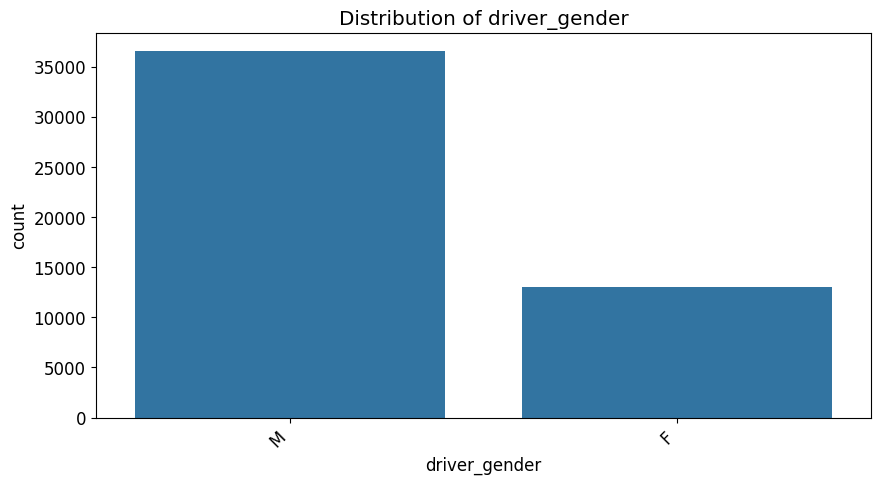


Distribution of driver_race:
driver_race
White       0.753595
Black       0.132994
Hispanic    0.082673
Asian       0.027732
Other       0.003005
Name: proportion, dtype: float64


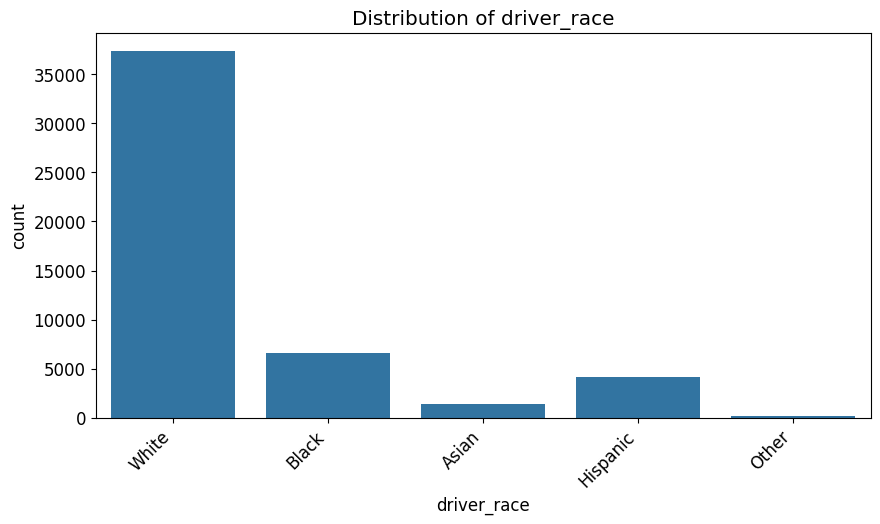


Distribution of violation:
violation
Speeding               0.648212
Moving violation       0.169117
Equipment              0.086243
Other                  0.059720
Registration/plates    0.036708
Name: proportion, dtype: float64


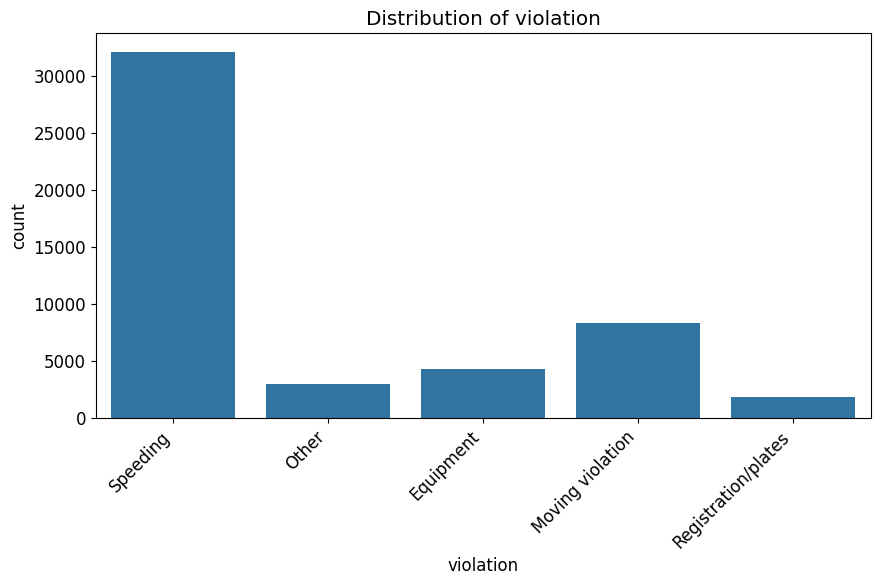

In [252]:
# Distribution of driver_gender, driver_race, and violation
for column in ['driver_gender', 'driver_race', 'violation']:
    print(f"\nDistribution of {column}:")
    print(df_new[column].value_counts(normalize=True))  # Normalized for proportions

    # Visualization (Optional):
    plt.figure(figsize=(10, 5))
    sns.countplot(x=column, data=df_new)
    plt.title(f"Distribution of {column}")
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
    plt.show()

In [316]:
# Using Plotly 
fig = px.histogram(df_new, x='driver_race', title='Distribution of Driver Race')
fig.update_xaxes(title_text='Race')
fig.update_yaxes(title_text='Count')
fig.show()

*This code iterates through the categorical columns ('driver_gender', 'driver_race', 'violation'). It uses value_counts(normalize=True) to calculate and display the frequency (as proportions) of each category within those columns. It also includes optional visualization using seaborn to create count plots for a visual representation of the distribution.*

We can see from the graphs:
- Male drivers are more than 2 times of the female driver
- There are more white drivers in the data which is more than the sum of other races.
- Based on how the data have always include the majority, the data lacks in representing more minority data.<br>


---

In [269]:
# Frequency and nature of drugs-related stops
drugs_related_stops = df_new[df_new['drugs_related_stop'] == True]
print(f"Number of drugs-related stops: {len(drugs_related_stops)}")

# Nature of violations in drugs-related stops
print("\nViolation types in drugs-related stops:")
print(drugs_related_stops['violation'].value_counts())

Number of drugs-related stops: 396

Violation types in drugs-related stops:
violation
Speeding               145
Moving violation       114
Equipment               90
Registration/plates     30
Other                   17
Name: count, dtype: int64


*This code first filters the DataFrame to select only rows where 'drugs_related_stop' is True. It then calculates and displays the total number of such stops. It examines the 'violation' column within these drug-related stops using value_counts() to determine the frequency of different violation types.* <br>

---

# Data Visualization:


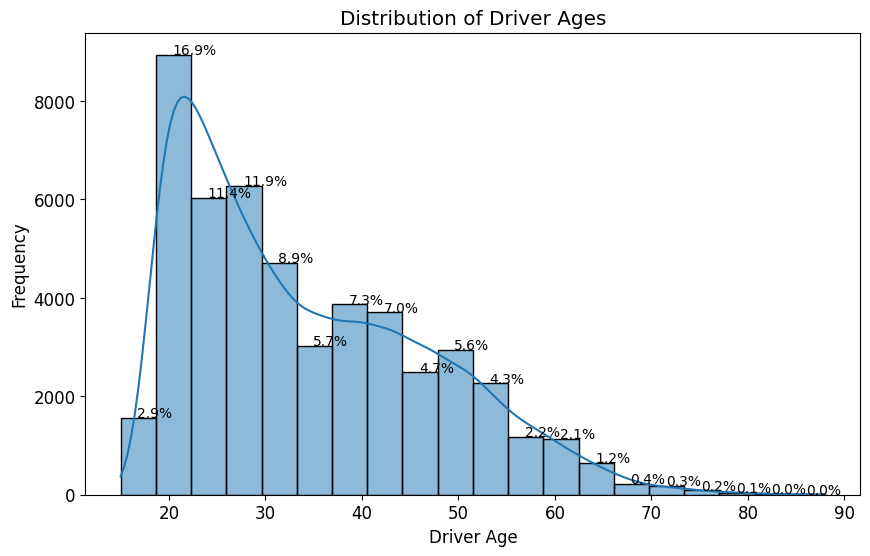

In [277]:
# Driver Age Distribution with Proportions

plt.figure(figsize=(10, 6))
ax = sns.histplot(df_new['driver_age'], bins=20, kde=True)  # bins can be adjusted as needed
plt.title("Distribution of Driver Ages")
plt.xlabel("Driver Age")
plt.ylabel("Frequency")

# Adding approximate proportions to the histogram bars 
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Avoid annotating empty bins
        percentage = '{:.1f}%'.format(100 * height / len(df_new))
        x = p.get_x() + p.get_width() / 2 - 0.1
        y = p.get_y() + height + 5  # Adjust vertical position as needed
        ax.annotate(percentage, (x, y), size=10)

plt.show()


In [317]:
# Using Plotly 
fig = px.histogram(df_new, x='driver_age', nbins=30, title="Distribution of Driver's Age")
fig.update_xaxes(title_text='Age')
fig.update_yaxes(title_text='Frequency')
fig.show()

Driver Age Distribution

- We iterate through the patches (bars) of the histogram (ax.patches).
- For each patch, we calculate the percentage based on its height relative to the total number of data points (len(df_new)).
- We use ax.annotate to add the percentage text above each bar, similar to the previous example.

<br>
---

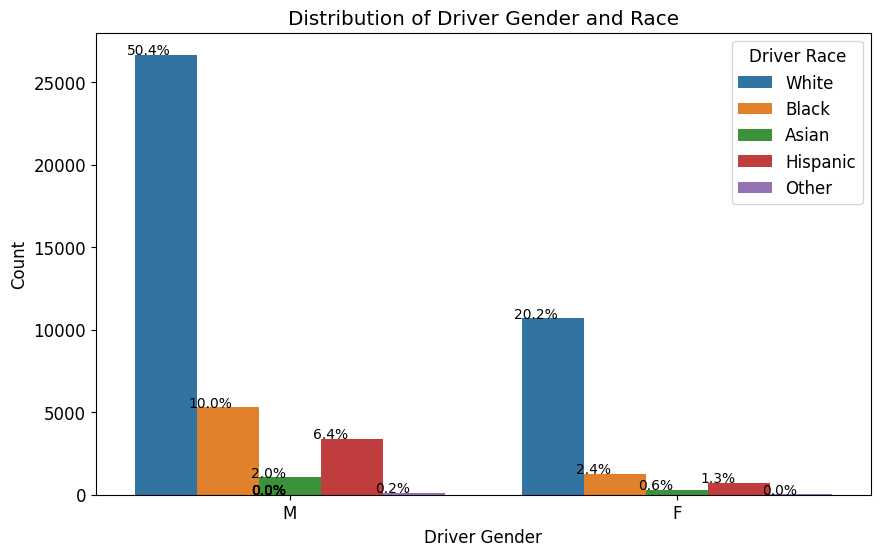

In [280]:
# Driver Gender and Race Distribution with Proportions

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='driver_gender', hue='driver_race', data=df_new)
plt.title("Distribution of Driver Gender and Race")
plt.xlabel("Driver Gender")
plt.ylabel("Count")
plt.legend(title="Driver Race")

# Adding proportions to the countplot bars
total = len(df_new)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2 - 0.1
    y = p.get_y() + p.get_height() + 5  # Adjust vertical position as needed
    ax.annotate(percentage, (x, y), size=10)

plt.show()

Driver Gender and Race Distribution

- Iterate through the patches of the countplot and add the percentage annotations above each bar.

---

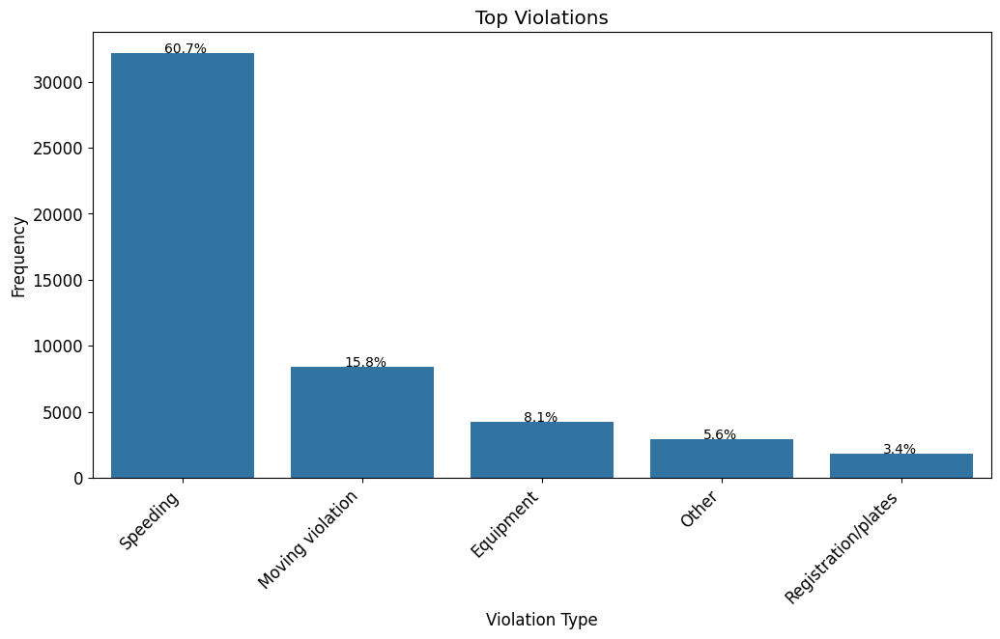

In [276]:
# Top violations
top_violations = df_new['violation'].value_counts().nlargest(10)

# Bar plot for top violations
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_violations.index, y=top_violations.values)
plt.title("Top Violations")
plt.xlabel("Violation Type")
plt.ylabel("Frequency")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability

# Adding proportions to the bars
total = len(df_new)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2 - 0.1
    y = p.get_y() + p.get_height() + 5  # Adjust vertical position as needed
    ax.annotate(percentage, (x, y), size=10)

plt.show()

In [318]:
# Using Plotly 
fig = px.histogram(df_new, y='violation', title='Violation Types', category_orders={'violation': df['violation'].value_counts().index})
fig.update_xaxes(title_text='Count')
fig.update_yaxes(title_text='Violation')
fig.show()

Top Violations:

- We use value_counts() to get the frequency of each violation type.
- nlargest(10) selects the top 10 violations based on their frequency.

Bar Plot:

- sns.barplot creates a bar plot with violation types on the x-axis and their frequencies on the y-axis.
- We rotate x-axis labels for better readability.

Adding Proportions:

- Similar to previous example, we iterate through the bars (ax.patches) and calculate the percentage of each violation type relative to the total number of records (len(df_new)).
- We use ax.annotate to display the percentages above the bars.

---

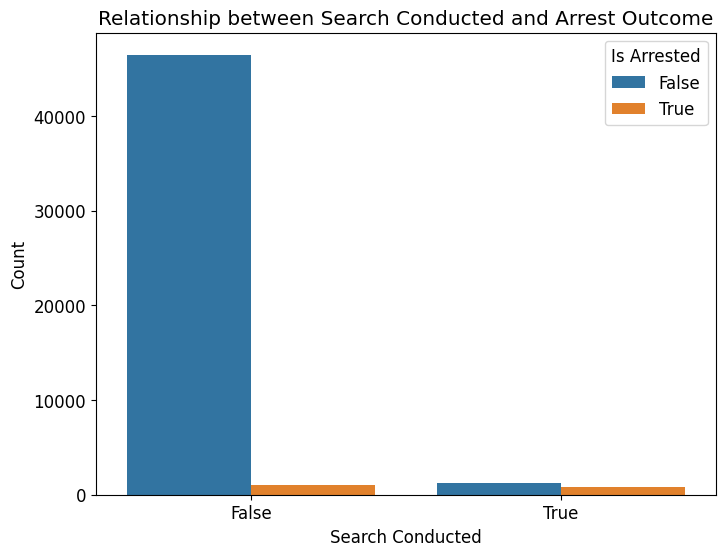

In [281]:
# Search Conducted and arrest made 

plt.figure(figsize=(8, 6))
sns.countplot(x='search_conducted', hue='is_arrested', data=df_new)
plt.title("Relationship between Search Conducted and Arrest Outcome")
plt.xlabel("Search Conducted")
plt.ylabel("Count")
plt.legend(title="Is Arrested")
plt.show()

- sns.countplot: Creates a grouped bar plot with 'search_conducted' on the x-axis and the count of occurrences on the y-axis.
- hue='is_arrested': Separates the bars based on whether an arrest was made ('is_arrested' values).
- legend(title="Is Arrested"): Adds a legend to identify the bars representing arrests and non-arrests.


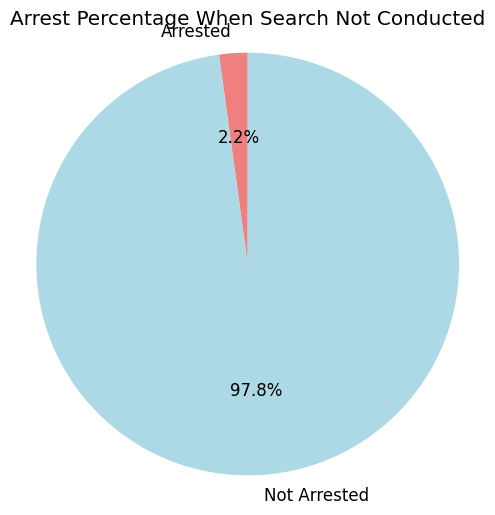

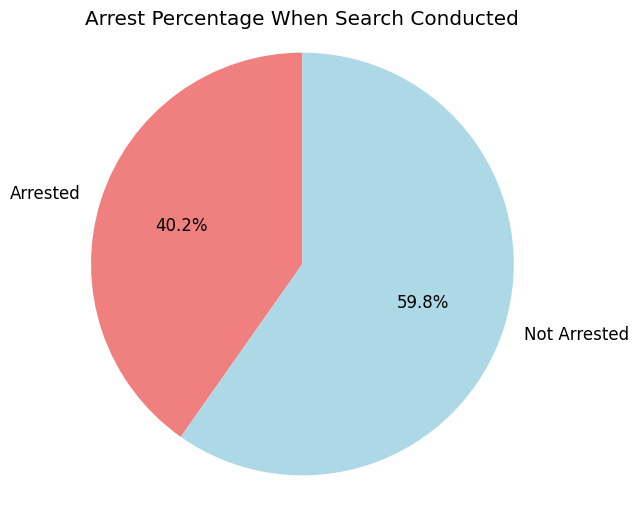

In [ ]:
# Calculate the percentages
search_not_conducted_arrests = df_new[(df_new['search_conducted'] == False) & (df_new['is_arrested'] == True)].shape[0]
search_not_conducted_total = df_new[df_new['search_conducted'] == False].shape[0]
search_conducted_arrests = df_new[(df_new['search_conducted'] == True) & (df_new['is_arrested'] == True)].shape[0]
search_conducted_total = df_new[df_new['search_conducted'] == True].shape[0]

# Calculate arrest percentages
arrest_percentage_no_search = (search_not_conducted_arrests / search_not_conducted_total) * 100
arrest_percentage_search = (search_conducted_arrests / search_conducted_total) * 100

# Create the  pie chart (Search Not Conducted)
labels_no_search = ['Arrested', 'Not Arrested']
sizes_no_search = [search_not_conducted_arrests, search_not_conducted_total - search_not_conducted_arrests]
colors_no_search = ['lightcoral', 'lightblue']

plt.figure(figsize=(6, 6))
plt.pie(sizes_no_search, labels=labels_no_search, colors=colors_no_search, autopct='%1.1f%%', startangle=90)
plt.title("Arrest Percentage When Search Not Conducted")
plt.axis('equal') 
plt.show()

# Create the  pie chart (Search Conducted)
labels_search = ['Arrested', 'Not Arrested']
sizes_search = [search_conducted_arrests, search_conducted_total - search_conducted_arrests]
colors_search = ['lightcoral', 'lightblue']

plt.figure(figsize=(6, 6))
plt.pie(sizes_search, labels=labels_search, colors=colors_search, autopct='%1.1f%%', startangle=90)
plt.title("Arrest Percentage When Search Conducted")
plt.axis('equal')  
plt.show()

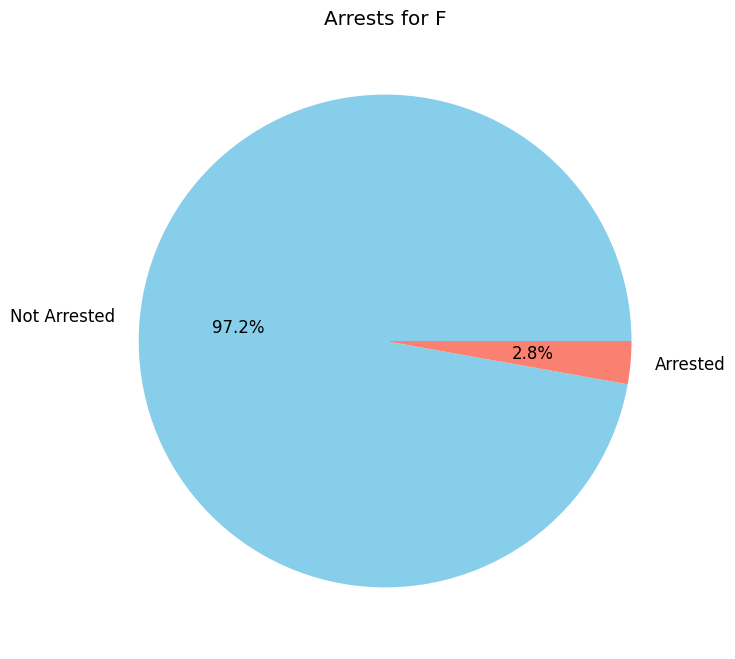

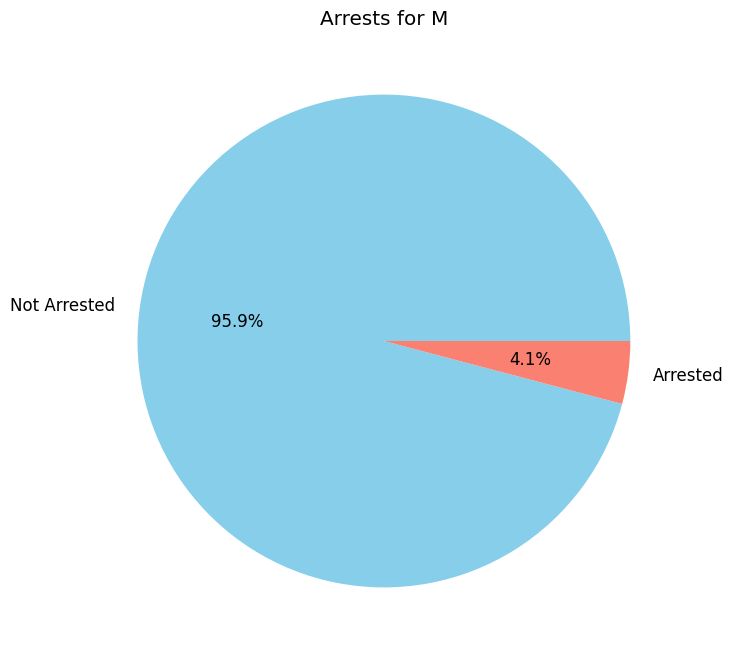

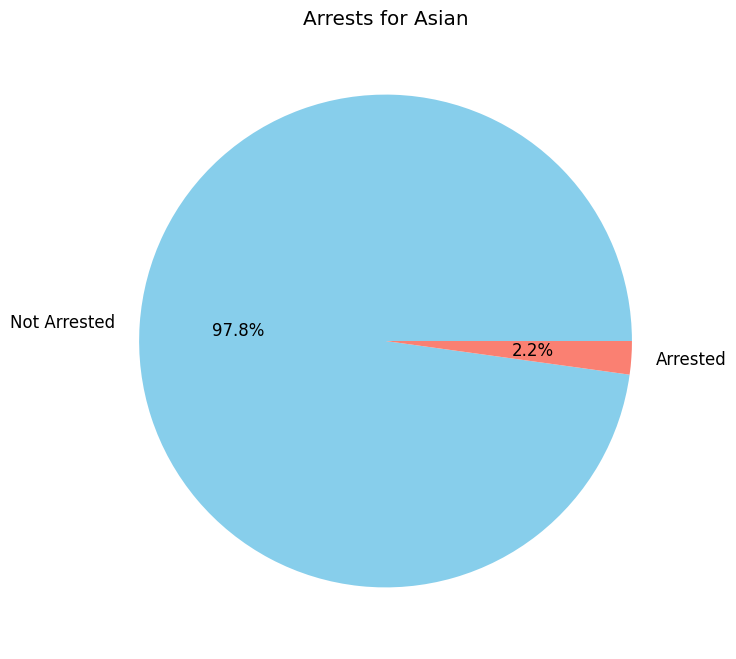

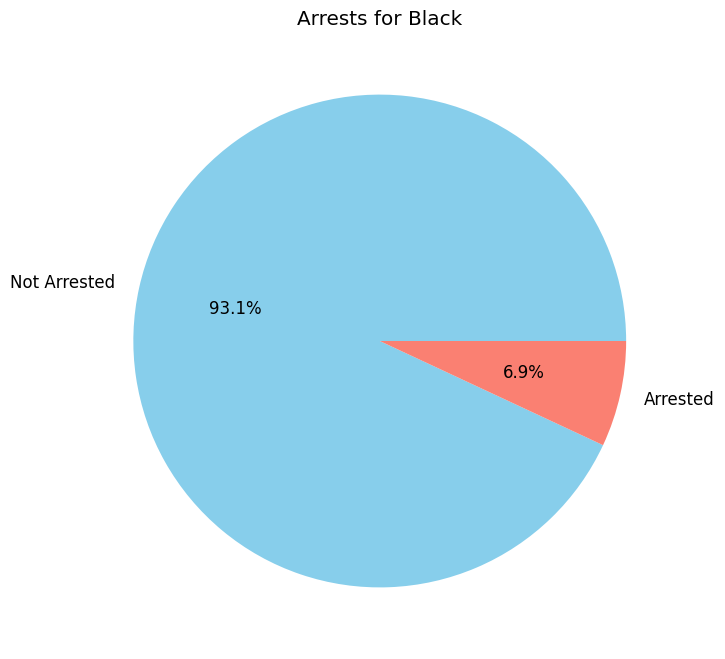

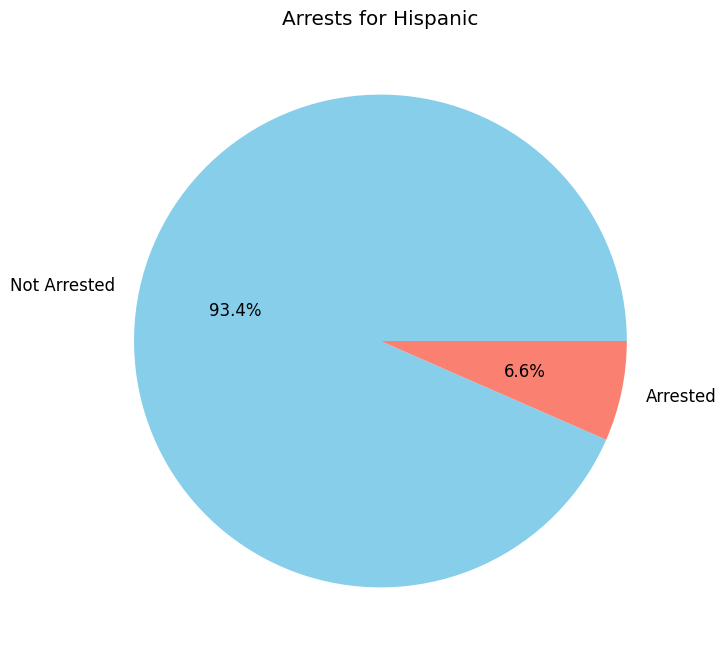

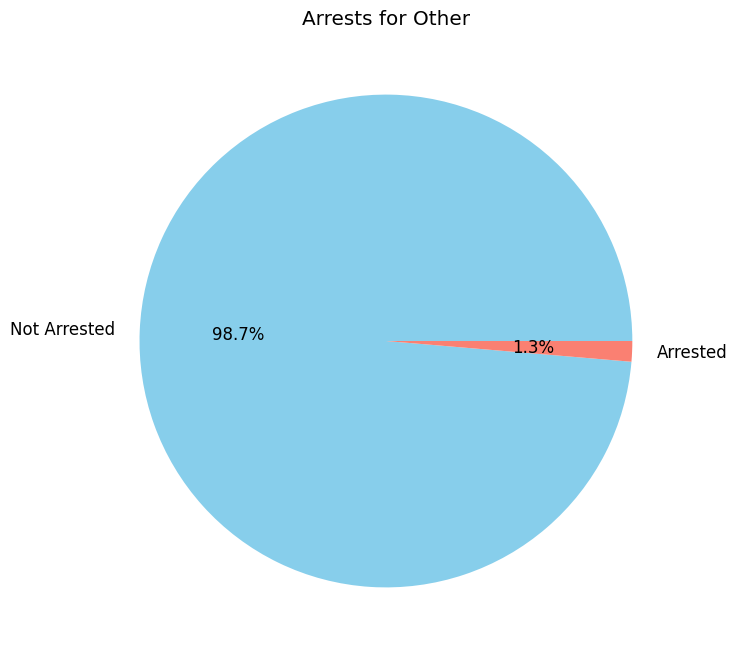

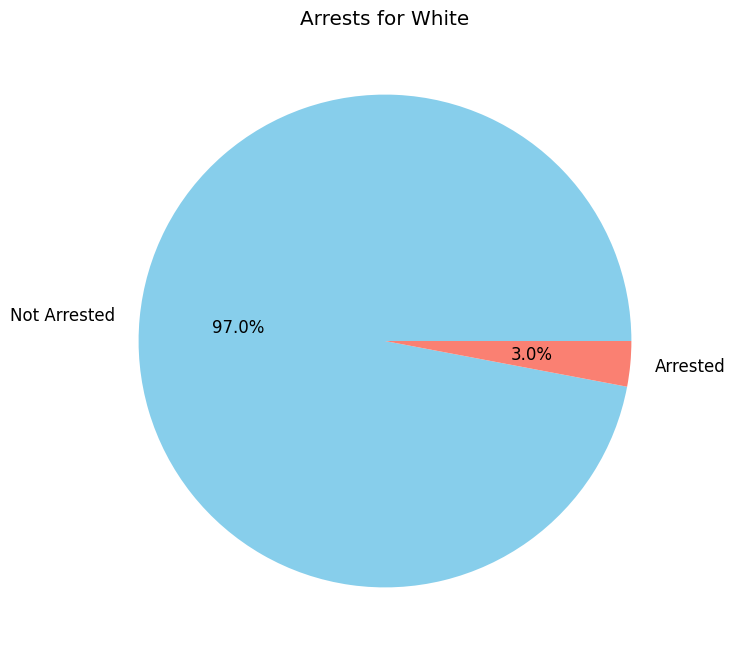

In [328]:
# Group the data by driver_gender and is_arrested
gender_arrest_counts = df_new.groupby(['driver_gender', 'is_arrested']).size().unstack(fill_value=0)

# Create pie charts for each gender
for gender in gender_arrest_counts.index:
    plt.figure(figsize=(8, 8))
    plt.pie(gender_arrest_counts.loc[gender], labels=['Not Arrested', 'Arrested'], autopct='%1.1f%%', colors=['skyblue', 'salmon'])
    plt.title(f'Arrests for {gender}')
    plt.show()

# Group the data by driver_race and is_arrested
race_arrest_counts = df_new.groupby(['driver_race', 'is_arrested']).size().unstack(fill_value=0)

# Create pie charts for each race
for race in race_arrest_counts.index:
    plt.figure(figsize=(8, 8))
    plt.pie(race_arrest_counts.loc[race], labels=['Not Arrested', 'Arrested'], autopct='%1.1f%%', colors=['skyblue', 'salmon'])
    plt.title(f'Arrests for {race}')
    plt.show()

 ### Further Expanding on the above visualization

- We use plt.pie to create each pie chart, setting the appropriate data, labels, colors, and other parameters.
- plt.title is used to provide a descriptive title for each chart.
- A pie chart is created for each combination of gender and race using a nested loop. The plt.pie function is used to create the pie chart, with labels for 'Not Arrested' and 'Arrested', and autopct='%1.1f%%' to show the percentage of each slice. The colors are set to 'skyblue' for 'Not Arrested' and 'salmon' for 'Arrested'.

---

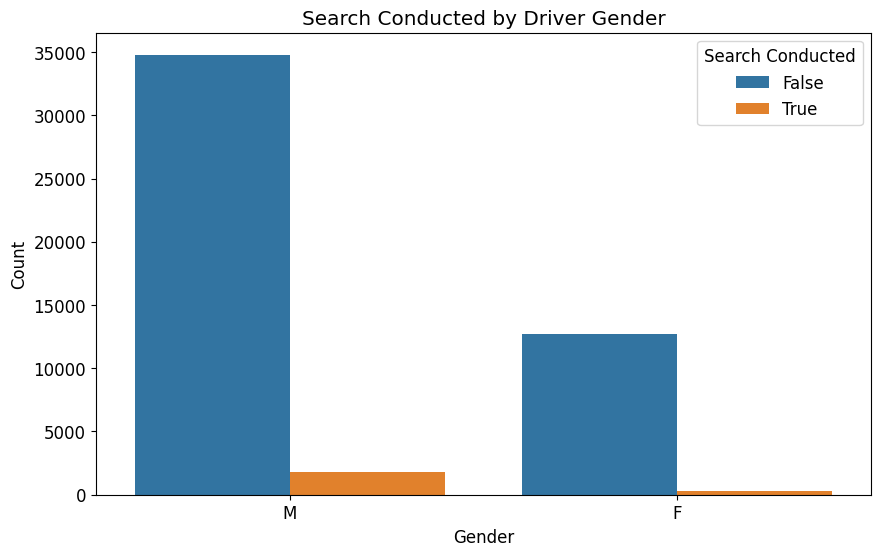

In [322]:
# Search conducted by driver gender
plt.figure(figsize=(10, 6))
sns.countplot(x='driver_gender', hue='search_conducted', data=df_new)
plt.title('Search Conducted by Driver Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Search Conducted')
plt.show()

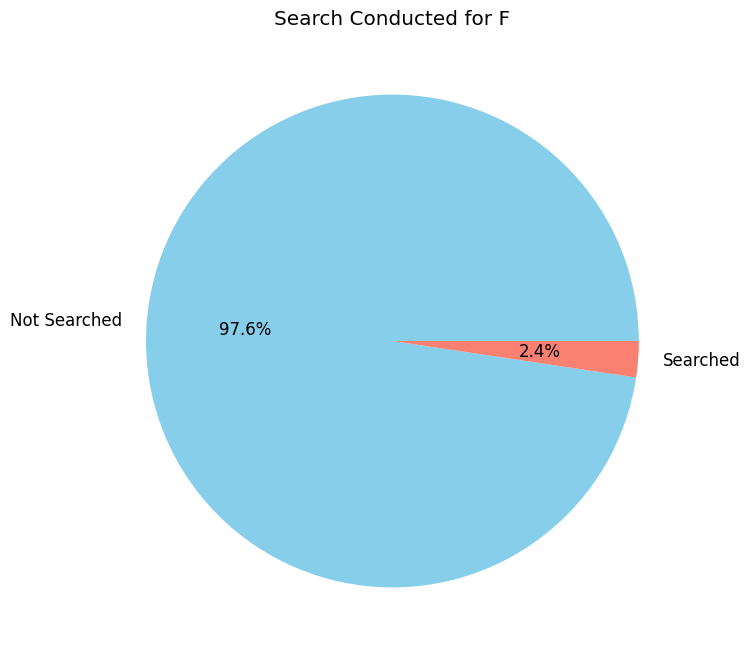

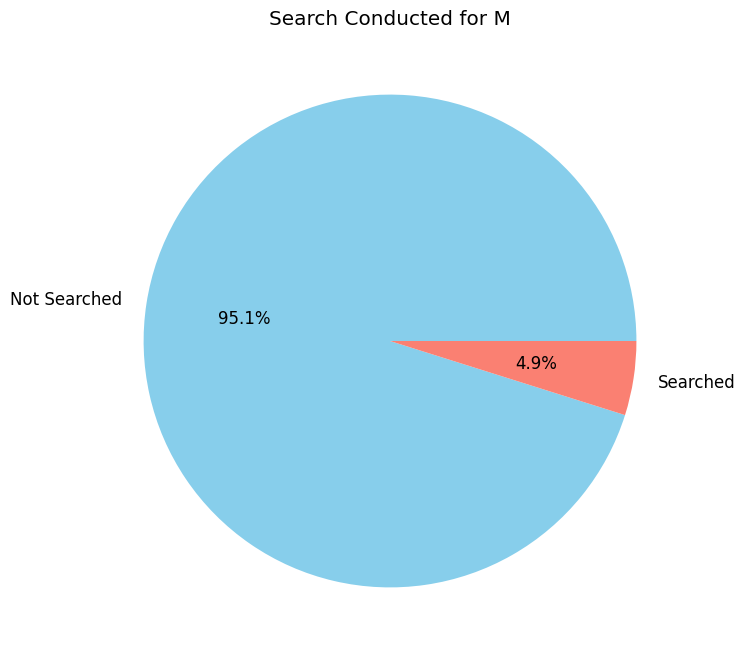

In [323]:
# Group the data by driver_gender and search_conducted
gender_search_counts = df_new.groupby(['driver_gender', 'search_conducted']).size().unstack(fill_value=0)

# Create pie charts for each driver gender
for gender in gender_search_counts.index:
    plt.figure(figsize=(8, 8))
    plt.pie(gender_search_counts.loc[gender], labels=['Not Searched', 'Searched'], autopct='%1.1f%%', colors=['skyblue', 'salmon'])
    plt.title(f'Search Conducted for {gender}')
    plt.show()

Creating pie charts for search conducted based on gender

---

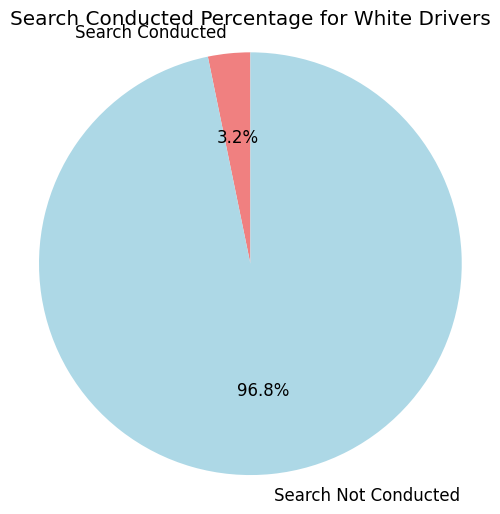

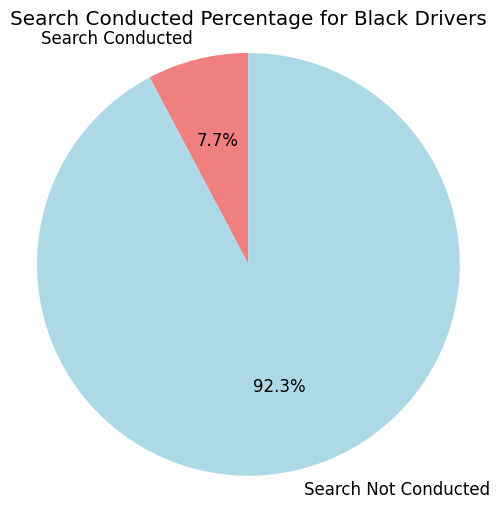

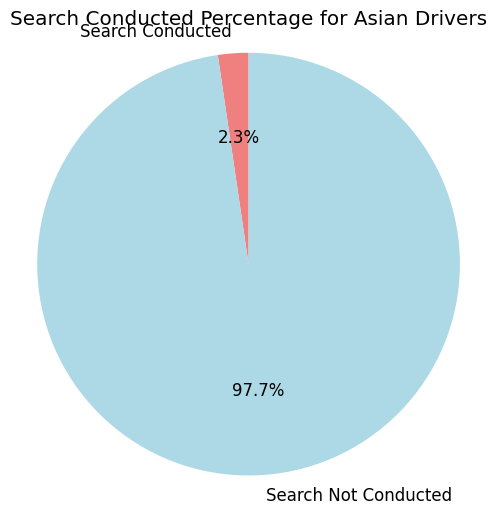

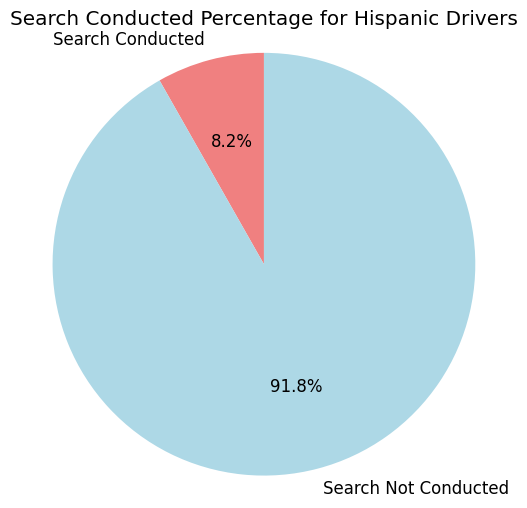

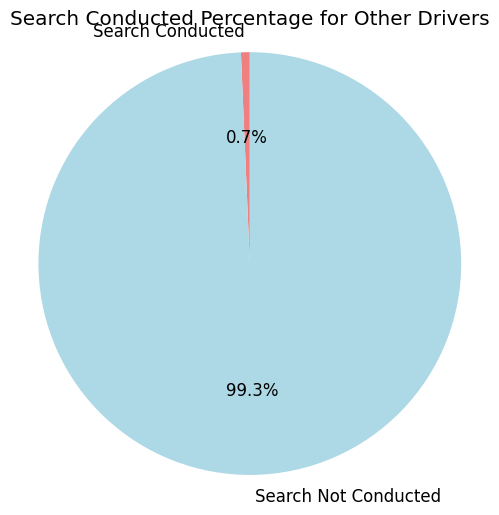

In [284]:
# Get unique driver races
driver_races = df_new['driver_race'].unique()

# Create pie charts for each driver race
for race in driver_races:
    # Filter data for the current race
    race_data = df_new[df_new['driver_race'] == race]

    # Calculate search conducted percentage
    search_conducted_count = race_data[race_data['search_conducted'] == True].shape[0]
    search_not_conducted_count = race_data[race_data['search_conducted'] == False].shape[0]
    total_count = search_conducted_count + search_not_conducted_count

    # Check if total count is greater than 0
    if total_count > 0:  
        search_conducted_percentage = (search_conducted_count / total_count) * 100
        
        # Create pie chart
        labels = ['Search Conducted', 'Search Not Conducted']
        sizes = [search_conducted_count, search_not_conducted_count]
        colors = ['lightcoral', 'lightblue']

        plt.figure(figsize=(6, 6))
        plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
        plt.title(f"Search Conducted Percentage for {race} Drivers")
        plt.axis('equal')
        plt.show()

Get Unique Races:

- We use df_new['driver_race'].unique() to get a list of distinct driver races in the dataset.

Loop through Races:

- We iterate through each race in the driver_races list.

Filter and Calculate:

- Inside the loop, we filter the DataFrame (df_new) to get data only for the current race.
- We calculate the percentage of searches conducted for that race.

Create Pie Chart:

- We create a pie chart using plt.pie with labels for "Search Conducted" and "Search Not Conducted," sizes based on the calculated counts, and specified colors.
- We set the title of the pie chart to indicate the driver race.
- plt.axis('equal') ensures the pie chart is circular.

Repeat for Each Race:
- The loop repeats the process of filtering, calculating, and creating a pie chart for each driver race in the dataset.

---

driver_race
White       1205
Black        510
Hispanic     337
Asian         32
Other          1
Name: count, dtype: int64
driver_race
White       37364
Black        6594
Hispanic     4099
Asian        1375
Other         149
Name: count, dtype: int64
driver_race
White       3.225029
Black       7.734304
Hispanic    8.221517
Asian       2.327273
Other       0.671141
Name: count, dtype: float64


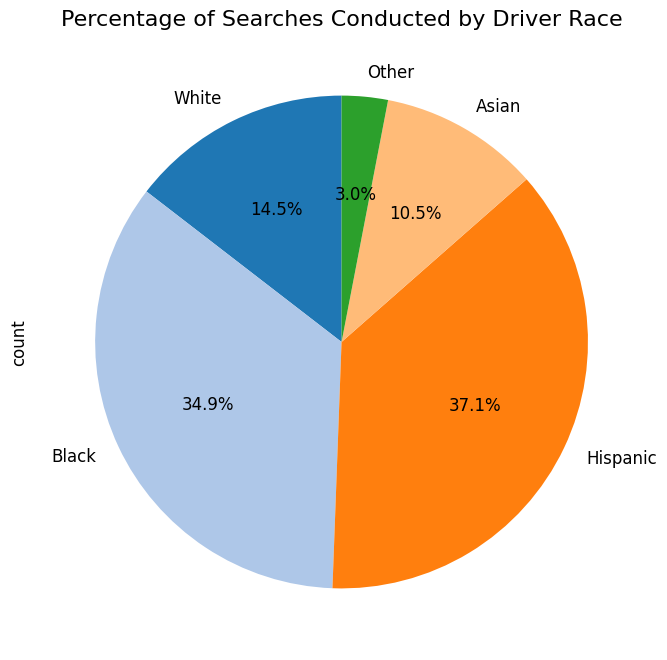

In [289]:
# Calculating the percentage of searches conducted within each race group
search_conducted_by_race = df_new[df_new['search_conducted'] == True]['driver_race'].value_counts()
total_by_race = df_new['driver_race'].value_counts()
percent_search_conducted = (search_conducted_by_race / total_by_race) * 100
print(search_conducted_by_race)
print(total_by_race)
print(percent_search_conducted)


# Plot the pie chart 
plt.figure(figsize=(10, 8))
colors = plt.get_cmap('tab20').colors  # Use a colormap with better color differentiation
percent_search_conducted.plot.pie(autopct='%1.1f%%', startangle=90, colors=colors)

plt.title('Percentage of Searches Conducted by Driver Race', fontsize=16)

plt.show()

Calculating the pie chart showing the percent of search conducted comparision within the races

---

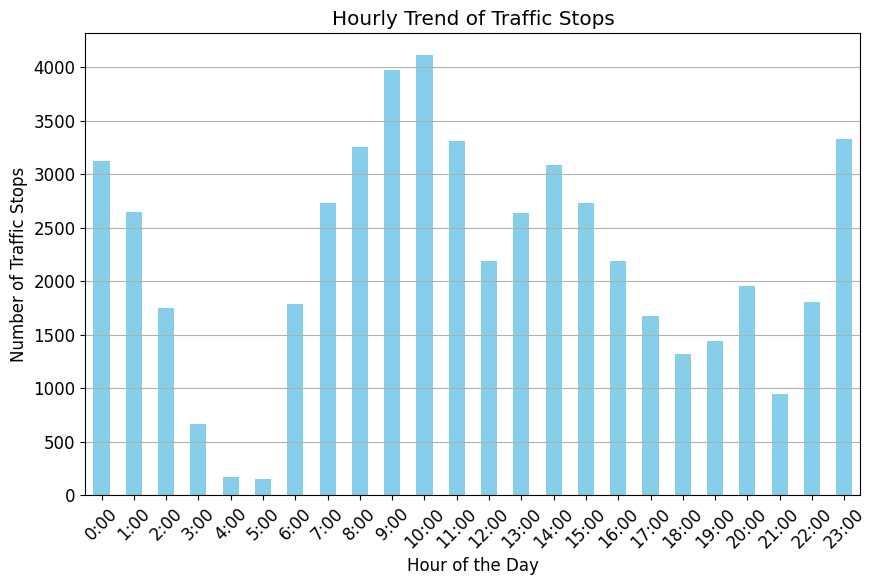

In [296]:
# Convert stop_time to datetime with a specified format
df_new['stop_time'] = pd.to_datetime(df_new['stop_time'], format='%H:%M:%S', errors='coerce')

# Extract the hour from the stop_time column
df_new['stop_hour'] = df_new['stop_time'].dt.hour

# Create a histogram to visualize the distribution of traffic stops by hour
plt.figure(figsize=(10, 6))
df_new['stop_hour'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Traffic Stops')
plt.title('Hourly Trend of Traffic Stops')
plt.xticks(range(24), [f'{i}:00' for i in range(24)], rotation=45)
plt.grid(axis='y')
plt.show()

In [319]:
# Interactive plot of stops by time of day using Plotly
fig = px.histogram(df_new, x='stop_time', nbins=24, title='Stops by Time of Day')
fig.update_xaxes(title_text='Time of Day')
fig.update_yaxes(title_text='Count')
fig.show()

Hourly Trend of Traffic Stops

- The stop_time column was converted to a datetime format to extract the hour of each traffic stop. A bar plot was then created to visualize the distribution of traffic stops by hour, helping to identify peak times.

---



<Figure size 1200x600 with 0 Axes>

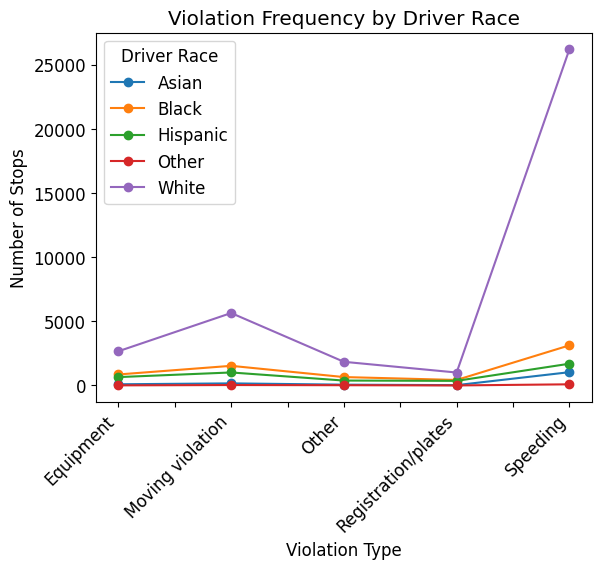

In [300]:
# Group by driver race and violation, then count occurrences
demographics_violations = df_new.groupby(['driver_race', 'violation'])['stop_date'].count().reset_index()

# Pivot the table for plotting
demographics_violations = demographics_violations.pivot(index='violation', columns='driver_race', values='stop_date')

# Create a line graph
plt.figure(figsize=(12, 6))
demographics_violations.plot(kind='line', marker='o')
plt.title('Violation Frequency by Driver Race')
plt.xlabel('Violation Type')
plt.ylabel('Number of Stops')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Driver Race')
plt.show()


- We group the data by 'driver_race' and 'violation' and count the occurrences using groupby and count.
- reset_index() converts the groupby result back into a DataFrame.
- We pivot the table using pivot to have violation types as rows, driver races as columns, and the count of stops as values. This format is suitable for creating a line graph.

---


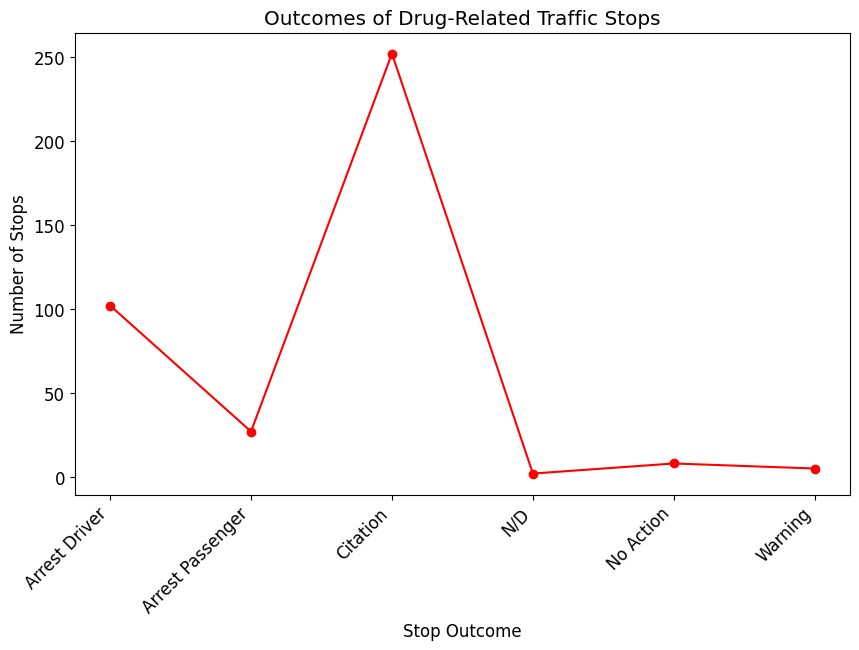

In [302]:
# Filter data for drug-related violations
drug_related_stops = df_new[df_new['drugs_related_stop'] == True]

# Group by stop outcome and count occurrences
outcome_counts = drug_related_stops.groupby('stop_outcome')['stop_date'].count()

# Create a line graph
plt.figure(figsize=(10, 6))
outcome_counts.plot(kind='line', marker='o', color='red')
plt.title("Outcomes of Drug-Related Traffic Stops")
plt.xlabel("Stop Outcome")
plt.ylabel("Number of Stops")
plt.xticks(rotation=45, ha='right')
plt.show()

Analyze the trends in the line graph to understand the most common outcomes for drug-related traffic stops. Identify any significant peaks or drops in the line to understand how outcomes vary across different categories.

---

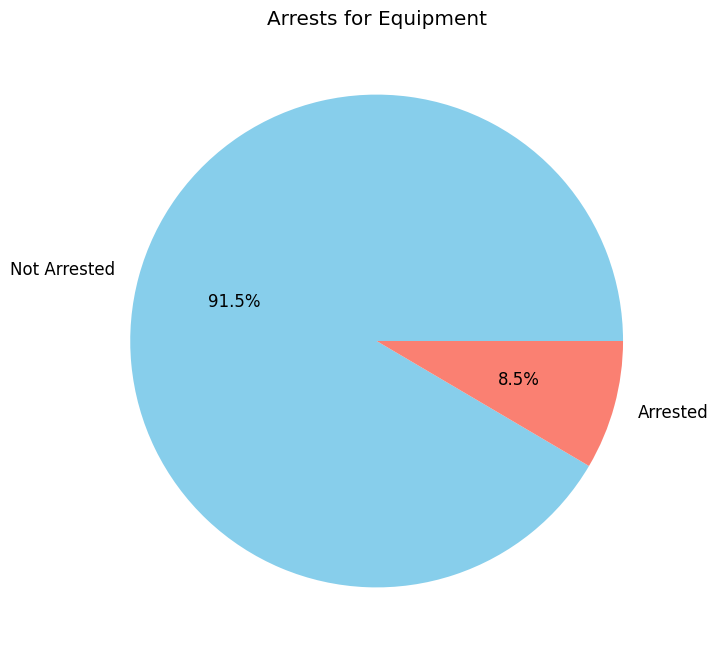

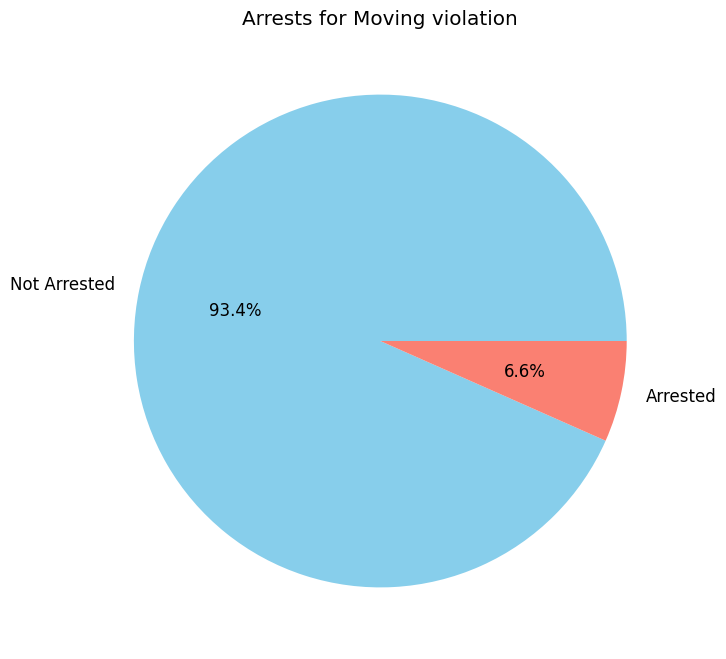

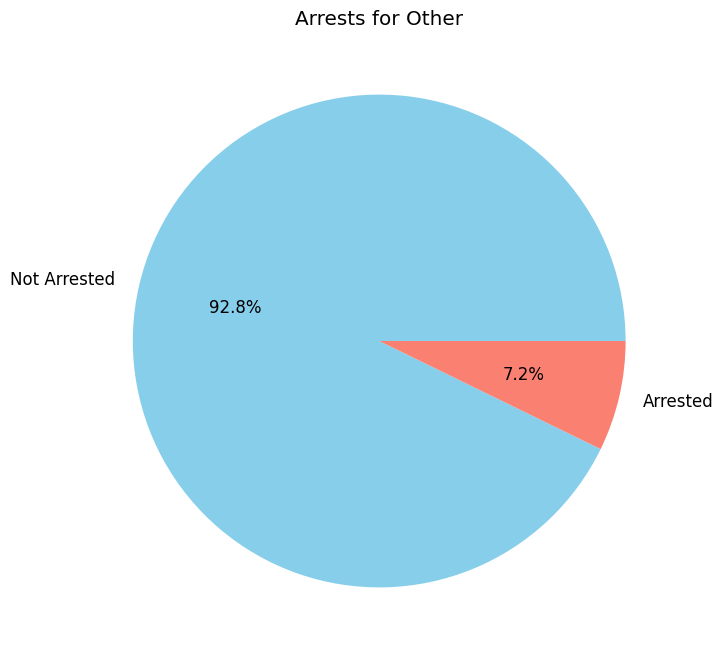

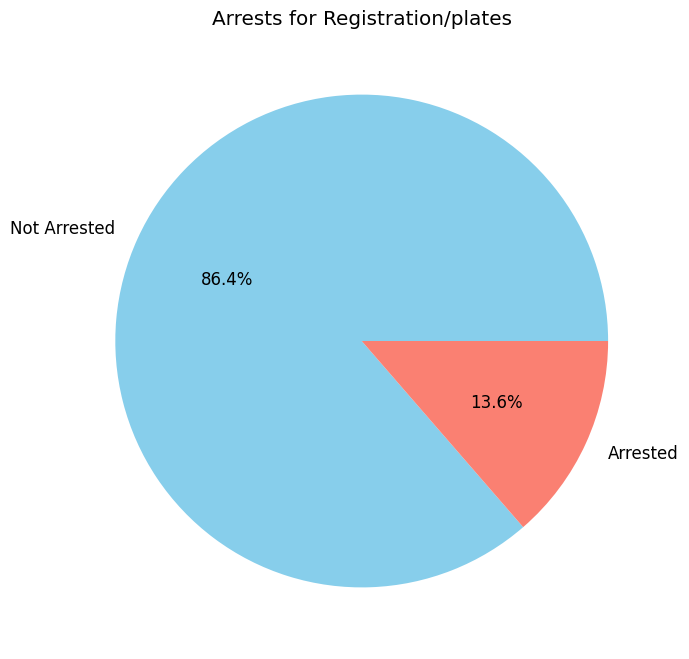

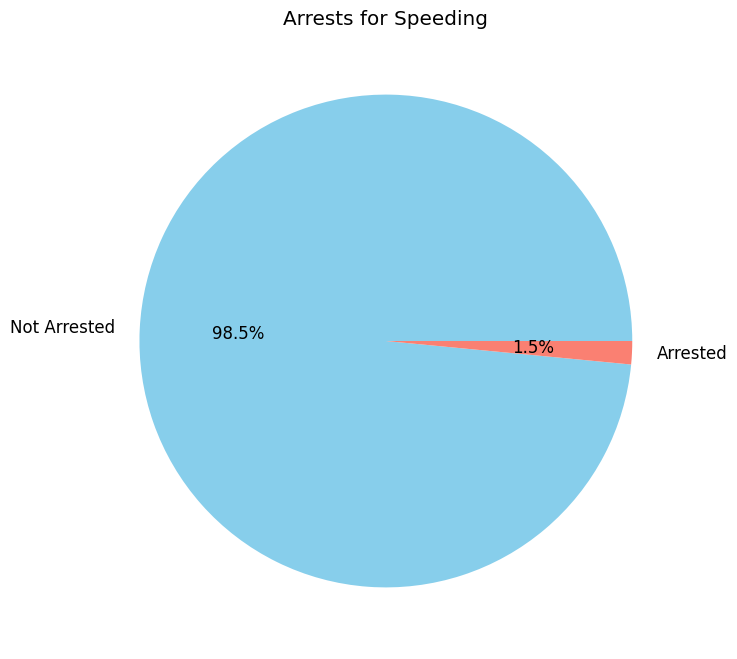

In [320]:
# Group the data by violation and is_arrested
violation_arrest_counts = df_new.groupby(['violation', 'is_arrested']).size().unstack(fill_value=0)

# Create pie charts for each violation type
for violation in violation_arrest_counts.index:
    plt.figure(figsize=(8, 8))
    plt.pie(violation_arrest_counts.loc[violation], labels=['Not Arrested', 'Arrested'], autopct='%1.1f%%', colors=['skyblue', 'salmon'])
    plt.title(f'Arrests for {violation}')
    plt.show()

Group the Data:

- The data is grouped by violation and is_arrested, and the size of each group is calculated. The unstack method is used to pivot the is_arrested values into columns, with fill_value=0 to handle any missing values.

Create Pie Charts:

- A pie chart is created for each violation type using a loop. The plt.pie function is used to create the pie chart, with labels for 'Not Arrested' and 'Arrested', and autopct='%1.1f%%' to show the percentage of each slice. The colors are set to 'skyblue' for 'Not Arrested' and 'salmon' for 'Arrested'.

In [ ]:
# Interactive plot of arrests by violation type using Plotly
fig = px.histogram(df_new, x='violation', color='is_arrested', barmode='group', title='Arrests by Violation Type', category_orders={'violation': df['violation'].value_counts().index})
fig.update_xaxes(title_text='Violation')
fig.update_yaxes(title_text='Count')
fig.show()

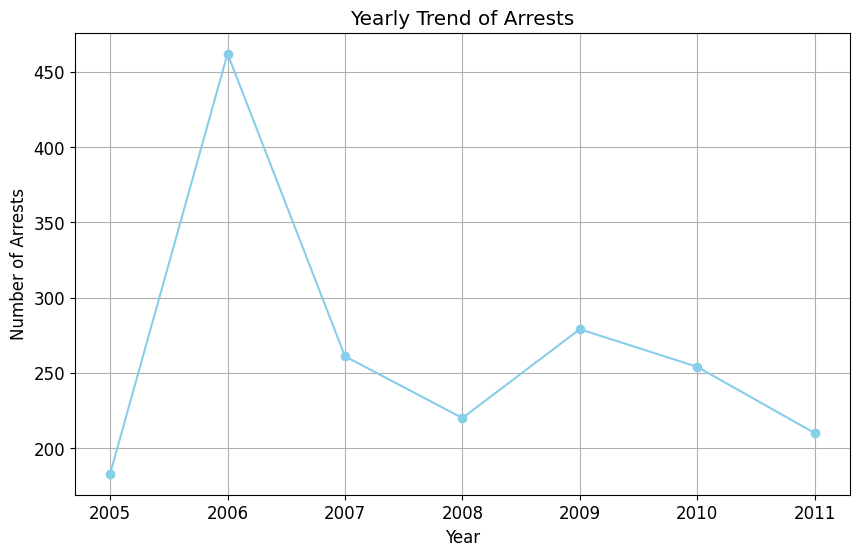

In [305]:
# Convert stop_date to datetime if it's not already
df_new['stop_date'] = pd.to_datetime(df_new['stop_date'], errors='coerce')

# Extract the year from the stop_date column
df_new['stop_year'] = df_new['stop_date'].dt.year

# Filter the DataFrame to include only rows where an arrest was made
arrests_per_year = df_new[df_new['is_arrested'] == True]['stop_year'].value_counts().sort_index()

# Create a line plot to visualize the number of arrests per year
plt.figure(figsize=(10, 6))
arrests_per_year.plot(kind='line', marker='o', color='skyblue')
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.title('Yearly Trend of Arrests')
plt.grid(True)
plt.show()

Convert stop_date to Datetime:

- The stop_date column is converted to a datetime format using pd.to_datetime, with errors='coerce' to handle any invalid parsing gracefully.

Extract the Year:

- After converting the stop_date column to datetime, the year is extracted using the .dt.year accessor and stored in a new column stop_year.

Filter for Arrests:

- The DataFrame is filtered to include only rows where an arrest was made (is_arrested is True), and the number of arrests per year is counted and sorted by year.

Create the Line Plot:

- A line plot is created to visualize the number of arrests per year, with markers to highlight each data point.

---

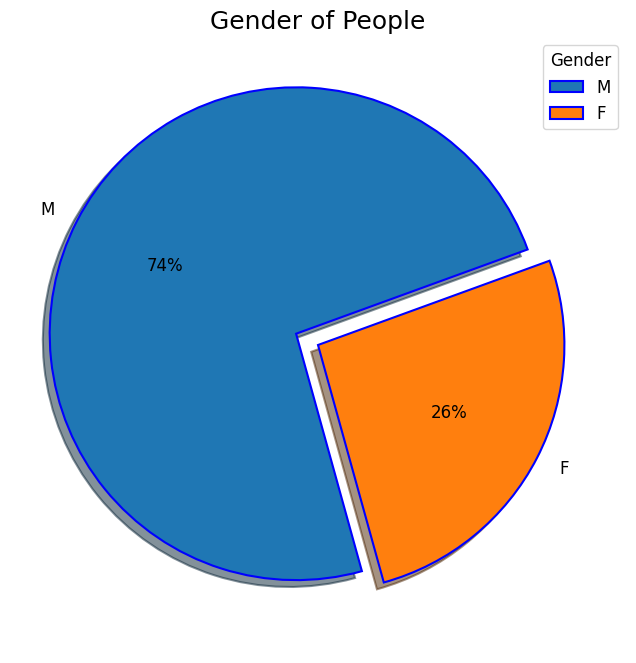

In [ ]:
# Count the occurrences of each gender
gender_counts = df_new['driver_gender'].value_counts()

# Customize pie chart colors, shadow, and rotation
colors = ['#1f77b4', '#ff7f0e']  # Colors 
explode = [0.1, 0]  # separate the first slice

plt.figure(figsize=(8, 8))
plt.pie(
    gender_counts,
    labels=gender_counts.index,
    autopct='%1.0f%%',
    startangle=20,  # Adjust start angle to rotate the chart
    colors=colors,
    explode=explode,
    shadow=True,  # Add shadow effect
    wedgeprops=dict(edgecolor='blue', linewidth=1.5)  # Border styling
)
plt.title('Gender of People', fontsize=18)
plt.legend(gender_counts.index, title='Gender', loc='upper right')
plt.show()